# MDS NK cells

EG54, EG55, EG56, EG57 and EG58 are MDS cases. All samples are from different donors. 

In this notebook aplastic anemia samples are merged together and UMAPs are generated based on RNA, proteins or latent space. Only NK cells are selected based on clustering + marker gene/protein analysis done in "easi_nk_AA_clustering" -notebook. Leiden clusters are calculated from UMAP based on latent space coordinates and highly expressed genes/markers are searched using scanpy rank_genes_groups -function. 

Finally, markers received from HRUH Aplastic anemia presentation (unpublished data) and Melsen et al. paper are visualized. 

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import anndata as ad
import scvi
import scanpy as sc
import umap

from ridgeplot import ridgeplot

import warnings

warnings.filterwarnings('ignore')



Global seed set to 0
/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [3]:
#Easigenomics dataset, all AA samples merged

adata = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/MDS_norm.h5ad')

In [4]:
adata

AnnData object with n_obs × n_vars = 13184 × 5031
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'eg_code', 'leiden_r1', 'new_cell_type', 'batch_group', 'batch', 'CD19', 'CD10', 'CD20', 'CD3', 'CD2_prot', 'CD11b', 'HLADR', 'CD38_prot', 'CD11c', 'CD7', 'CD45', 'CD33', 'CD81', 'CD73', 'CD123', 'CD14', 'CD45RA', 'CD45RO', 'CD4', 'CD8a', 'CD197', 'CD127', 'CD56', 'CD5', 'CD15', 'CD64', 'CD117', 'CD24', 'CD44_prot', 'CD58', 'CD66ace', 'CD13', 'CD34_prot', 'leiden_0.5', 'leiden_0.3', 'leiden_0.2', 'leiden_0.1', 'leiden_0.15', 'leiden_0.18'
    var: 'gene_ids', 'feature_types', 'n_cells-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_no

In [5]:
#Calculating neighbors for UMAPs

sc.pp.neighbors(adata, use_rep="X_totalVI")    

sc.tl.umap(adata)


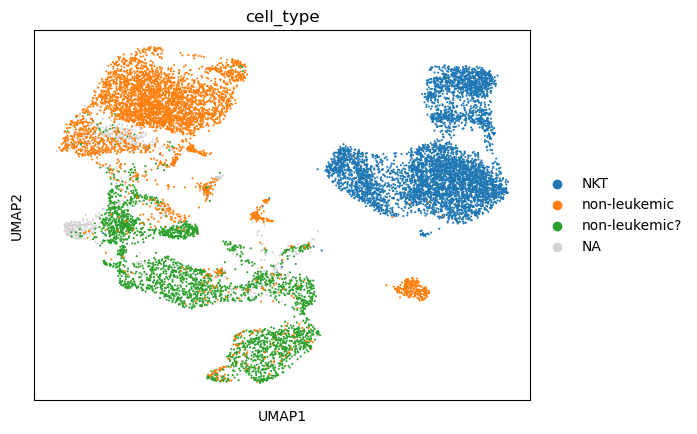

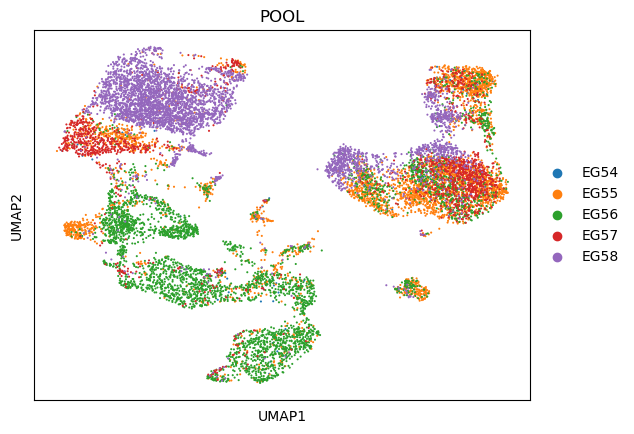

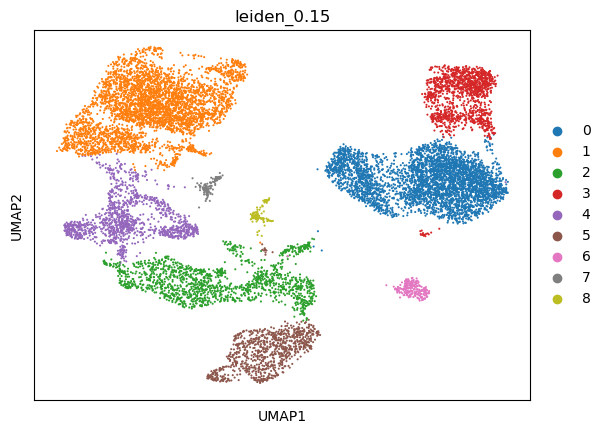

In [7]:
#latent space

sc.pl.umap(adata, color = ['cell_type'], color_map = 'viridis')

sc.pl.umap(adata, color = ['POOL'], color_map = 'viridis')

sc.pl.umap(adata, color = ['leiden_0.15'], color_map = 'viridis')


In [8]:
#selecting only NK cells (=cluster 0), identified in earlier notebook

adata_nk = adata[adata.obs['leiden_0.15'] == "0"]

In [9]:
#Within the NK cell cluster there are cells annotated as "non-leukemic", these cells are removed from analysis 

adata_nk = adata_nk[adata_nk.obs['cell_type'] == "NKT"]

In [10]:
adata_nk

View of AnnData object with n_obs × n_vars = 3943 × 5031
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'eg_code', 'leiden_r1', 'new_cell_type', 'batch_group', 'batch', 'CD19', 'CD10', 'CD20', 'CD3', 'CD2_prot', 'CD11b', 'HLADR', 'CD38_prot', 'CD11c', 'CD7', 'CD45', 'CD33', 'CD81', 'CD73', 'CD123', 'CD14', 'CD45RA', 'CD45RO', 'CD4', 'CD8a', 'CD197', 'CD127', 'CD56', 'CD5', 'CD15', 'CD64', 'CD117', 'CD24', 'CD44_prot', 'CD58', 'CD66ace', 'CD13', 'CD34_prot', 'leiden_0.5', 'leiden_0.3', 'leiden_0.2', 'leiden_0.1', 'leiden_0.15', 'leiden_0.18'
    var: 'gene_ids', 'feature_types', 'n_cells-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispers

In [12]:
#Calculating neighbors for UMAPs, only NK cells

sc.pp.neighbors(adata_nk, use_rep="X_totalVI")    

sc.tl.umap(adata_nk)

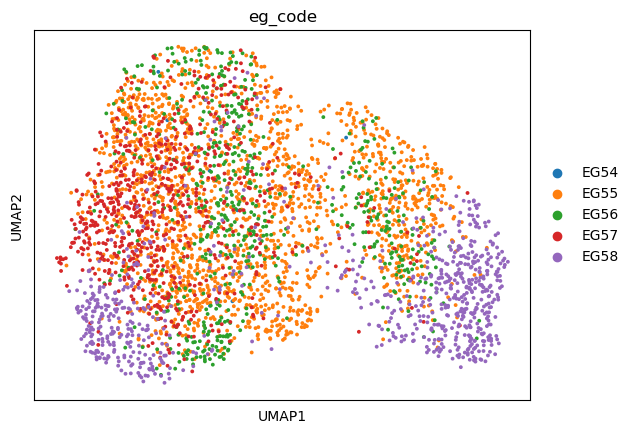

In [13]:
sc.pl.umap(adata_nk, color = ['eg_code'], color_map = 'viridis')

## Clustering by protein expression

In [14]:
adata_nk_prot = adata_nk.copy()

In [15]:
#Calculating neighbors for UMAPs

sc.pp.neighbors(adata_nk_prot, use_rep="protein_expression_dsb")    

sc.tl.umap(adata_nk_prot)

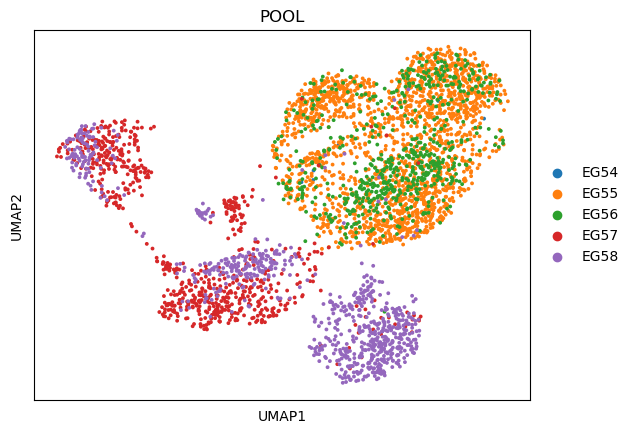

In [16]:
sc.pl.umap(adata_nk_prot, color = ['POOL'], color_map = 'viridis')

## Clustering by RNA

In [17]:
adata_nk_rna = adata_nk.copy()

In [18]:
sc.pp.pca(adata_nk_rna)

In [19]:
#calculating neighbors

sc.pp.neighbors(adata_nk_rna)

sc.tl.umap(adata_nk_rna)

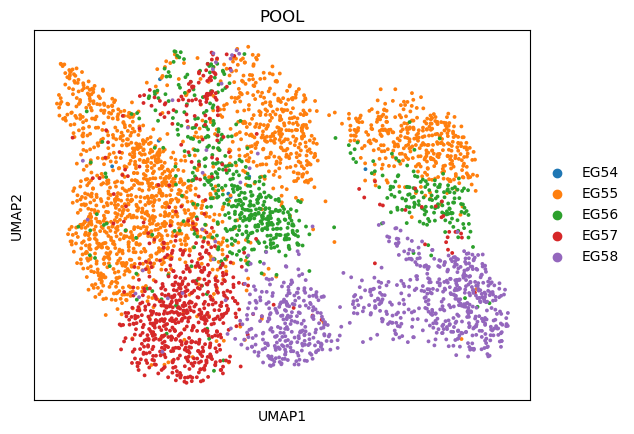

In [20]:
sc.pl.umap(adata_nk_rna, color = ['POOL'], color_map = 'viridis')

In [21]:
#Calculating leidens for latent object
sc.tl.leiden(adata_nk, resolution = 0.6, key_added = "leiden_0.6")
sc.tl.leiden(adata_nk, resolution = 0.7, key_added = "leiden_0.7")
sc.tl.leiden(adata_nk, resolution = 0.8, key_added = "leiden_0.8")


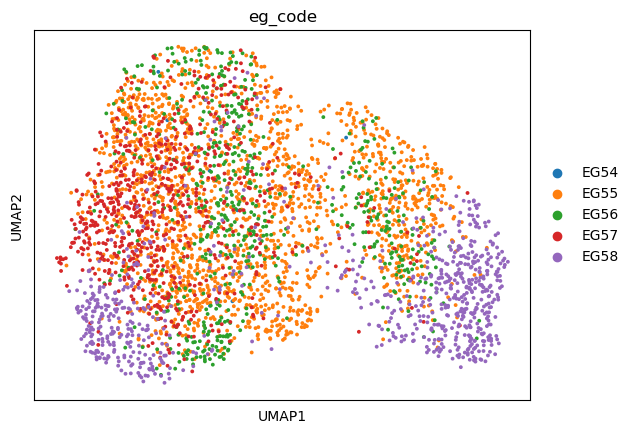

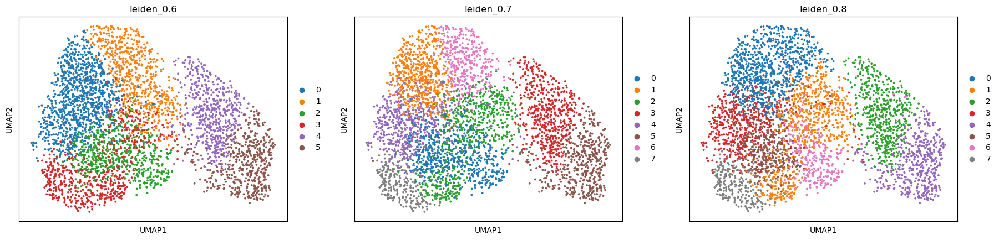

In [22]:
sc.pl.umap(adata_nk, color = ['eg_code'], color_map = 'viridis')
sc.pl.umap(adata_nk, color=['leiden_0.6', 'leiden_0.7', 'leiden_0.8'], ncols =3)

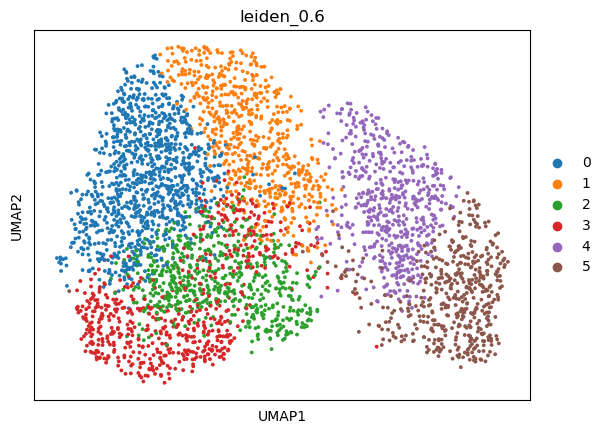

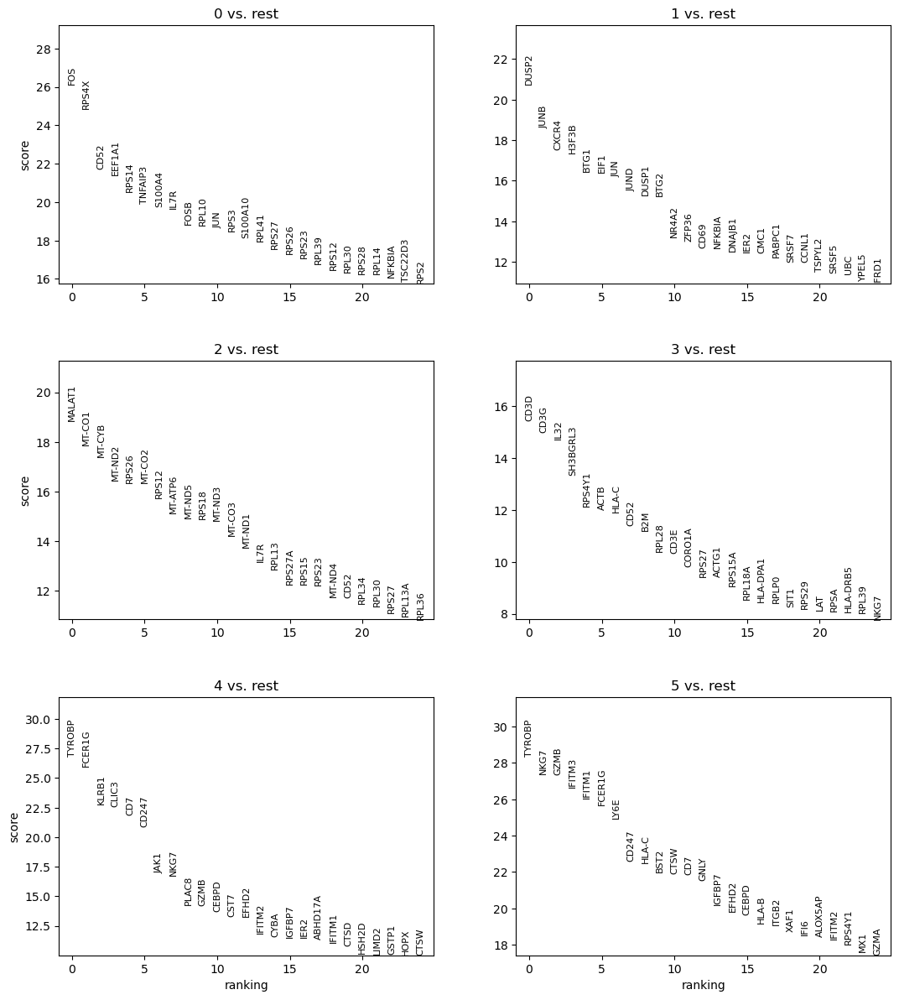

In [24]:
sc.pl.umap(adata_nk, color=['leiden_0.6'], ncols =3)

sc.tl.rank_genes_groups(adata_nk, 'leiden_0.6', method='wilcoxon')
sc.pl.rank_genes_groups(adata_nk, n_genes=25, sharey=False, ncols=2)

In [25]:
#Removing mitochondrial and ribosomal genes

#genes to be removed
mito_genes = adata_nk.var_names.str.startswith('MT-')
ribo_genes = adata_nk.var_names.str.startswith('RPL')
ribo_genes1 = adata_nk.var_names.str.startswith('RPS')

remove = np.add(mito_genes, ribo_genes)
remove = np.add(remove, ribo_genes1)

#other genes kept
keep = np.invert(remove)

adata_nk = adata_nk[:,keep]

#print(adata_gex.n_obs, adata_gex.n_vars)

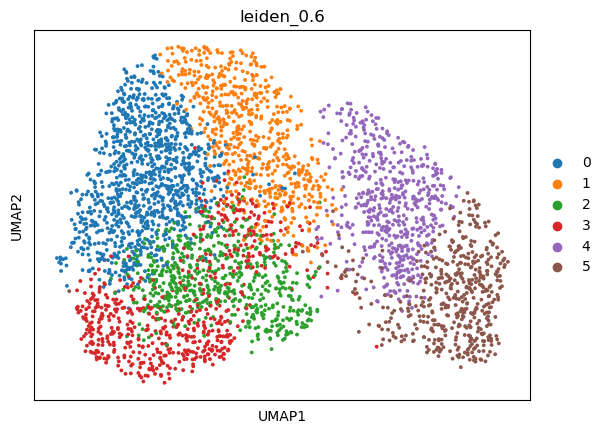

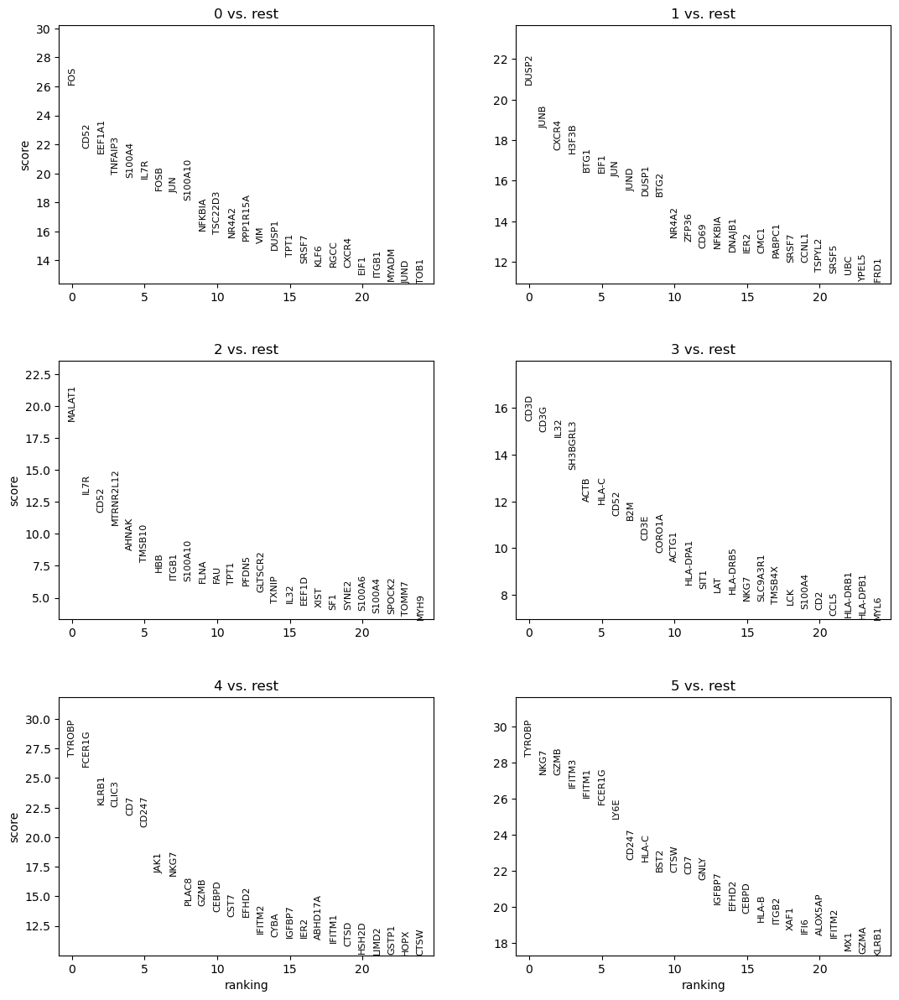

In [29]:
sc.pl.umap(adata_nk, color=['leiden_0.6'], ncols =3)

sc.tl.rank_genes_groups(adata_nk, 'leiden_0.6', method='wilcoxon')
sc.pl.rank_genes_groups(adata_nk, n_genes=25, sharey=False, ncols=2)

In [63]:
cd56dim = ['GZMB', 'NKG7', 'KLRB1'] #PRF1, FCGR3A, CCL4, KLRD1 not found
adaptive_like = ['CD3E', 'CD2', 'CD52', 'RHOB'] #HLA-DR, GZMH, KLRC3, KLRG1, LAG3 missing
activated = ['NFKBIA', 'NR4A2', 'LMNA', 'HIF1A'] #NKB1, EIF not found
#cd56bright = ['XCL1', 'XCL2', 'NCAM1', 'GZMK' #not found
cd56dimcd16dim= ['IL2RG', 'JUND', 'RUNX3'] #SA0018/9 not found
cycling = ['MK167']

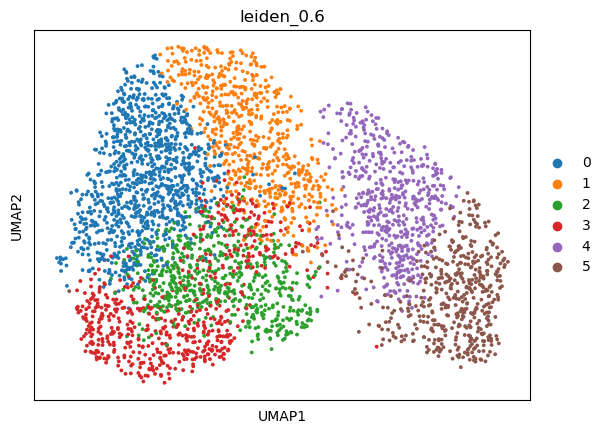

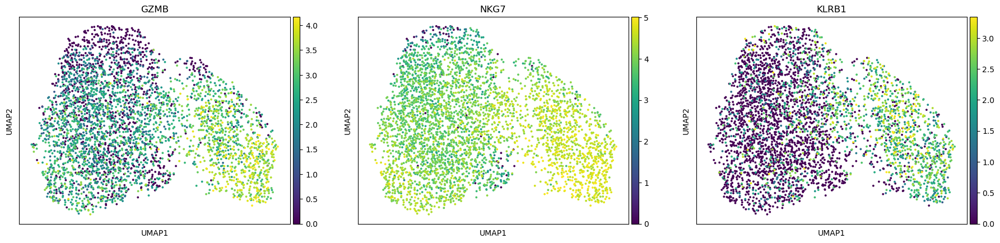

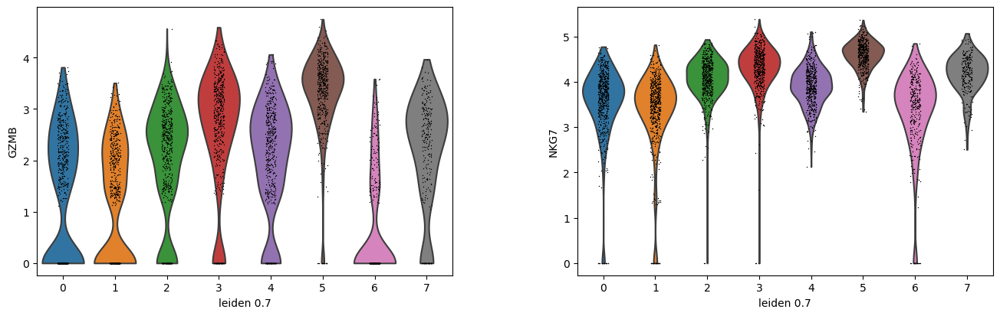

In [51]:
#CD56dim
sc.pl.umap(adata_nk, color=['leiden_0.6'])
sc.pl.umap(adata_nk, color=cd56dim, ncols = 3, vmax="p99")
sc.pl.violin(adata_nk, [ 'GZMB', 'NKG7'], groupby='leiden_0.7') 

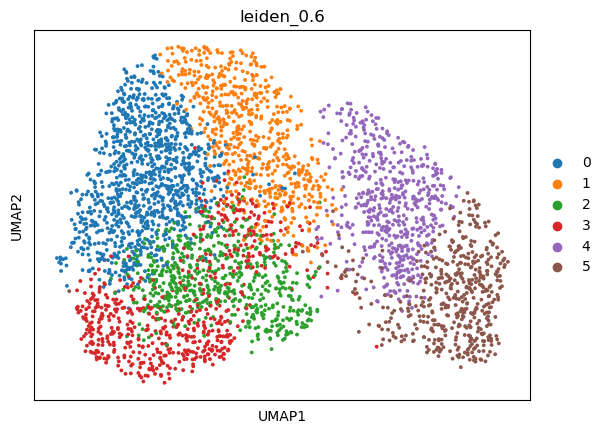

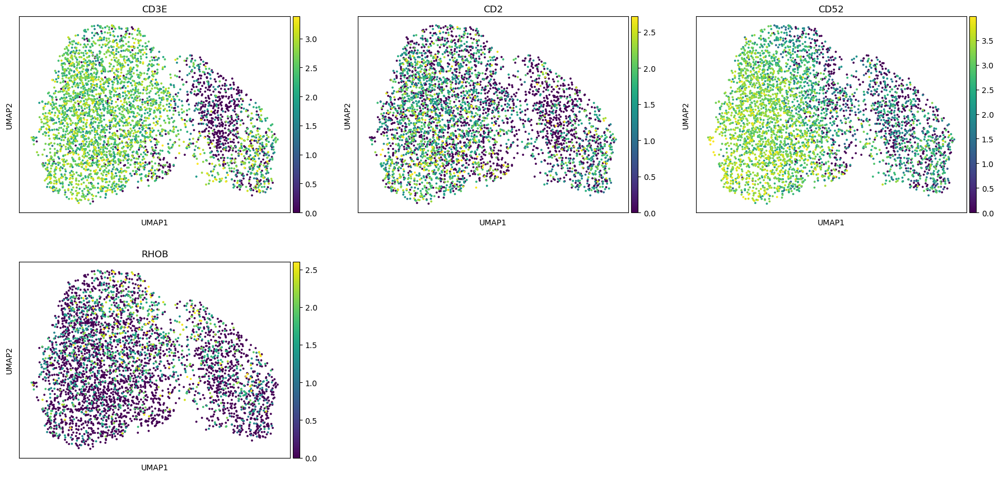

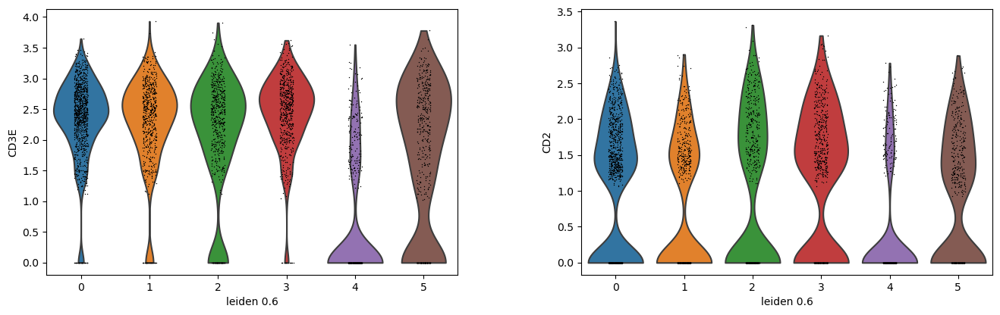

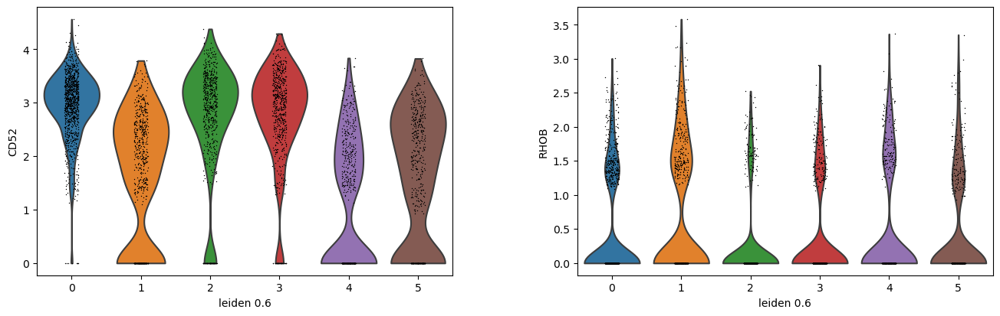

In [57]:
#Adaptive like NK cells

sc.pl.umap(adata_nk, color=['leiden_0.6'])
sc.pl.umap(adata_nk, color=adaptive_like, ncols = 3, vmax="p99")


sc.pl.violin(adata_nk, ['CD3E', 'CD2'], groupby='leiden_0.6')

sc.pl.violin(adata_nk, ['CD52', 'RHOB'], groupby='leiden_0.6')




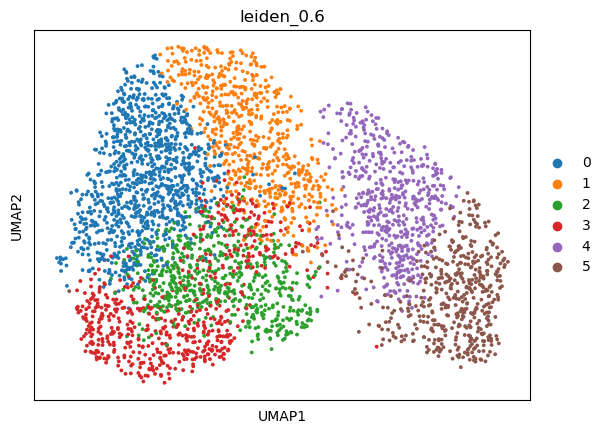

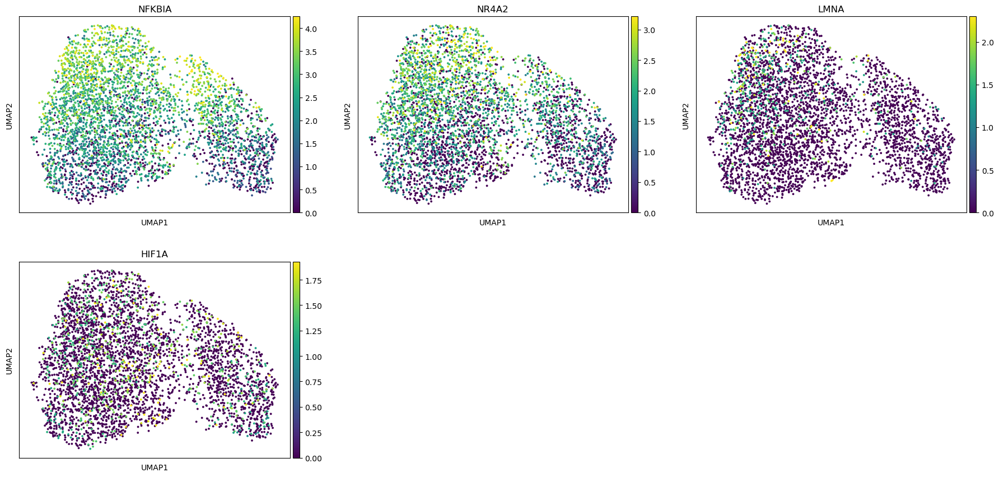

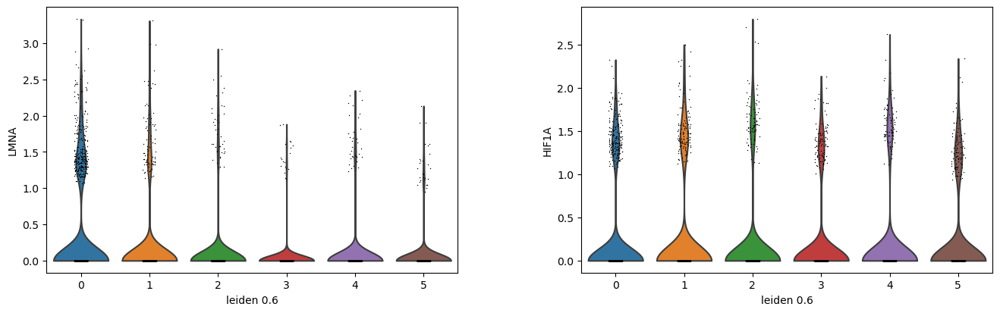

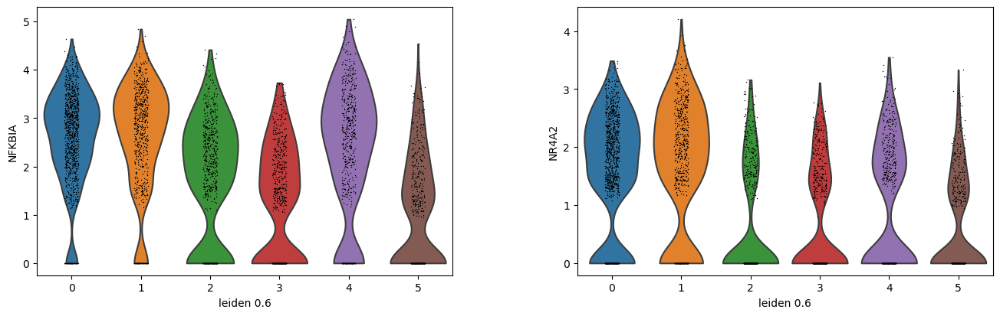

In [56]:
#Activated NK

sc.pl.umap(adata_nk, color=['leiden_0.6'])
sc.pl.umap(adata_nk, color=activated, ncols = 3, vmax="p99")

sc.pl.violin(adata_nk, ['LMNA', 'HIF1A'], groupby='leiden_0.6')
sc.pl.violin(adata_nk, ['NFKBIA' , 'NR4A2'], groupby='leiden_0.6') 




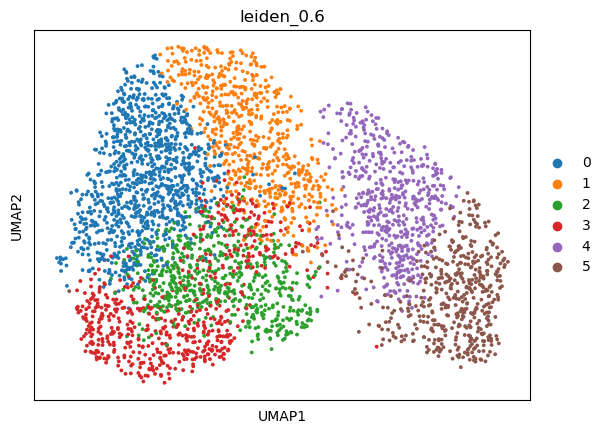

KeyError: 'Could not find key XCL2 in .var_names or .obs.columns.'

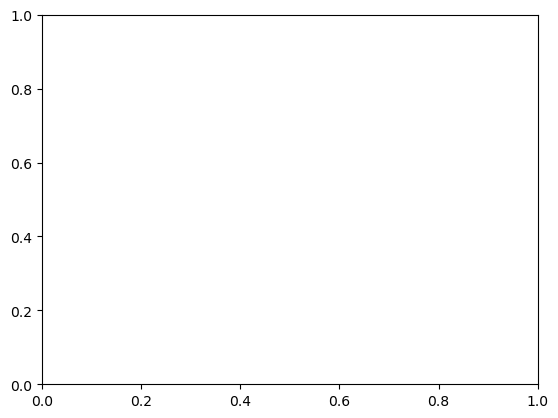

In [64]:
#CD56bright

sc.pl.umap(adata_nk, color=['leiden_0.6'])
sc.pl.umap(adata_nk, color=cd56bright, ncols = 3, vmax="p99")

sc.pl.violin(adata_nk,  ['GZMK', 'XCL1', 'XCL2'], groupby='leiden_0.6')

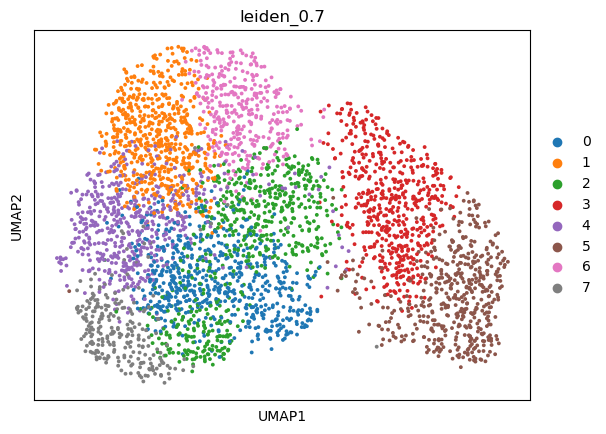

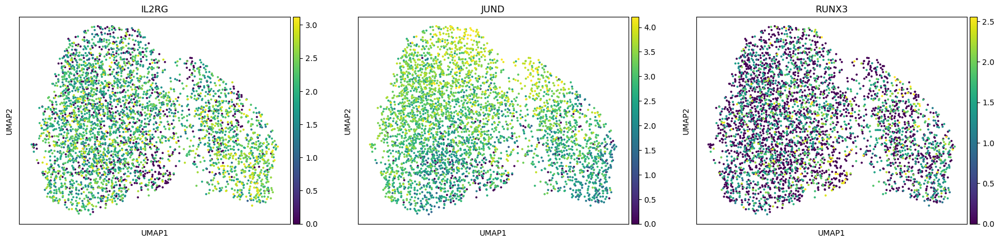

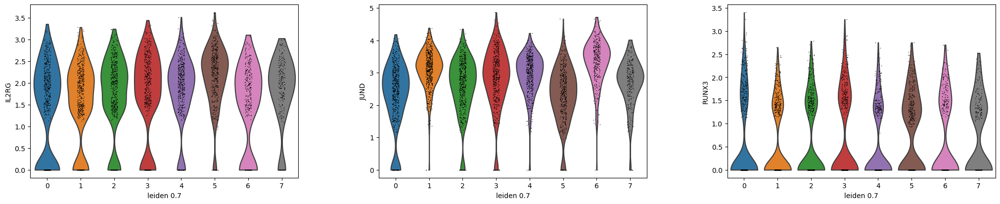

In [65]:
#CD56dim, CD16dim

sc.pl.umap(adata_nk, color=['leiden_0.7'])
sc.pl.umap(adata_nk, color=cd56dimcd16dim, ncols = 3, vmax="p99")

sc.pl.violin(adata_nk,  ['IL2RG', 'JUND', 'RUNX3'], groupby='leiden_0.7')


In [68]:
#Tissue-resident NK

#tr_mels= ['XCL1', 'GZMK', 'CCL3', 'CCL4', 'CD160', 'DUSP2', 'CXCR4', 'BTG1'] #XCL1,  not found

#sc.pl.umap(adata_nk, color=tr_mels, ncols = 3, vmax="p99")

KeyError: 'Could not find key CD160 in .var_names or .obs.columns.'

<Figure size 2183.4x960 with 0 Axes>

KeyError: 'Could not find key GZMH in .var_names or .obs.columns.'

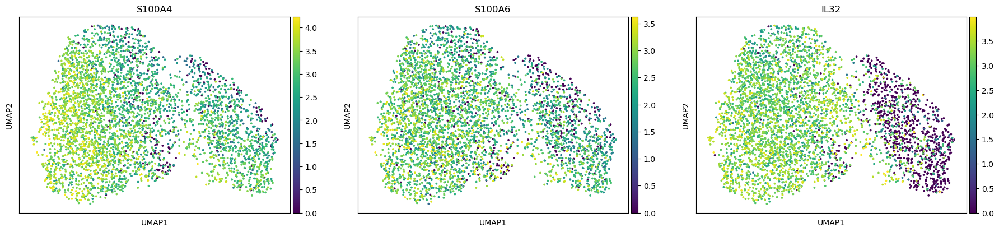

In [69]:
#proliferating NK

prolif_high = ['S100A4', 'S100A6', 'IL32', 'GZMH', 'GNLY'] #KLRC2 not found
prolif_low = ['KLRB1'] #KLRC1 not found

sc.pl.umap(adata_nk, color=prolif_high, ncols = 3, vmax="p99")
sc.pl.umap(adata_nk, color=prolif_low, ncols = 3, vmax="p99")

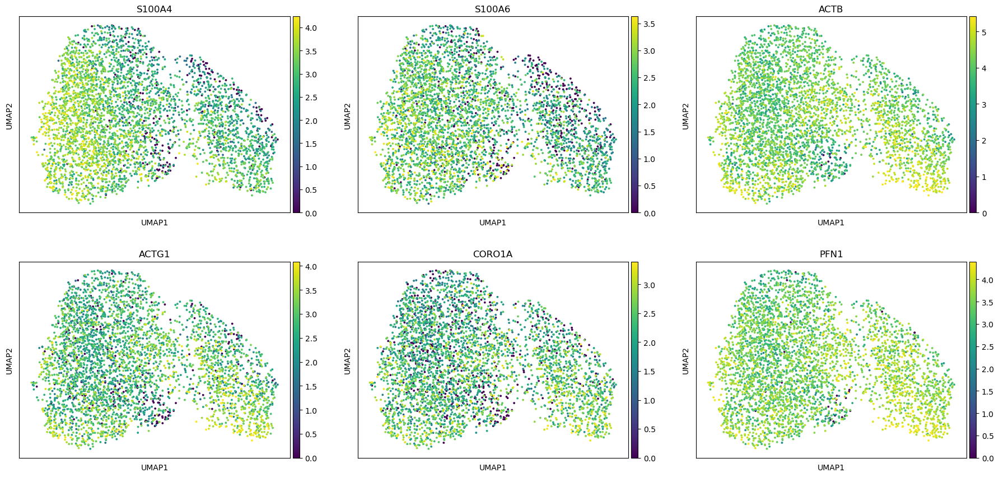

In [70]:
#Mature NK cells

cd56dim_1_high= ['S100A4', 'S100A6', 'ACTB', 'ACTG1', 'CORO1A', 'PFN1']
# cd56dim_1_low = ['GZMK'] not measured

sc.pl.umap(adata_nk, color=cd56dim_1_high, ncols = 3, vmax="p99")
#sc.pl.umap(adata_nk, color=cd56dim_1_low, ncols = 3, vmax="p99")



In [71]:
#CD56bright NK cells, SELL = CD62L, NCAM1 = CD56, IL7R = CD127

cd56bright_mels = ['KLRC1', 'SELL', 'CD2', 'IL7R'] #KIT, NCAM1 not found
cd56bright_mels_prot= ['CD56', "CD2_prot", 'CD127'] #CD62L not measured

print("RNA markers")
sc.pl.umap(adata_nk, color=cd56bright_mels, ncols = 3, vmax="p99")

print("Protein markers")

sc.pl.umap(adata_nk, color=cd56bright_mels_prot, ncols = 3, vmax="p99")

RNA markers


KeyError: 'Could not find key KLRC1 in .var_names or .obs.columns.'

<Figure size 2183.4x960 with 0 Axes>

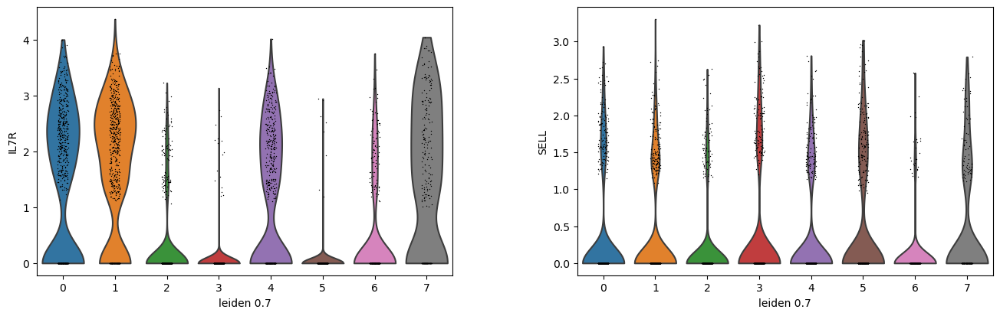

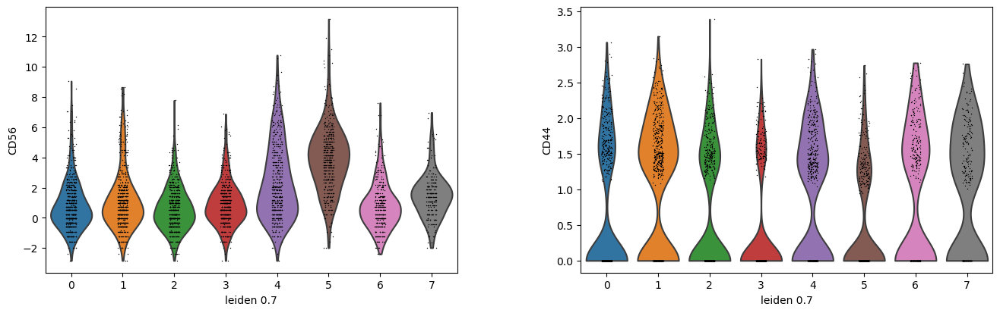

In [72]:
#CD56bright markers

sc.pl.violin(adata_nk, ['IL7R', 'SELL'], groupby='leiden_0.7')

sc.pl.violin(adata_nk, ['CD56', 'CD44'], groupby='leiden_0.7')